# LMS Project2 : Gender Voice Prediction  

###### Problem statement :
    1. he current process is a manual classification of gender using their voice.
    This is very tedious and time-consuming as it needs to be repeated every time a new customer joins.
    2.companey want to make process of prediction of gender form manual system to automated system,using acuosting properties of speech or voice  
    

###### Your Roll
1. You have been appointed as data science consulant
2. You have been provided with data of samples and you have to recognise male and female voice  
3. Role is to build classification model to predict using dataset 


###### Observations of dataset :
    1.Data has been provided which has 2851 rowes and 22 columns
    2.Data has null value  
    3.test data does not have label columns, it contains 317 roew and 21 columns 
    4.model to be evaluated based on F1 score 
    
    

###### Dataset Feature Description
The Dataset contains the following columns:
Column Name	Description
Id	Unique Id
meanfreq	Mean frequency (in kHz) for the voice sample
sd	Standard deviation of the frequency
median	Median frequency (in kHz) for the voice sample
Q25	First quantile (in kHz)
Q75	Third quantile (in kHz)
IQR	Interquartile range (in kHz)
skew	Skewness of the voice sample
kurt	Kurtosis of the voice sample
sp.ent	Spectral entropy
sfm	Spectral flatness of the voice sample
mode	Mode frequency
centroid	Frequency centroid
peakf	Peak frequency (the frequency with the highest energy)
meanfun	Average of fundamental frequency measured across the acoustic signal
minfun	Minimum fundamental frequency measured across the acoustic signal
maxfun	Maximum fundamental frequency measured across the acoustic signal
meandom	Average of dominant frequency measured across the acoustic signal
mindom	Minimum of dominant frequency measured across the acoustic signal
maxdom	Maximum of dominant frequency measured across the acoustic signal
dfrange	Range of dominant frequency measured across the acoustic signal
modindx	Modulation index. Calculated as the accumulated absolute difference between adjacent Measurements of fundamental frequencies divided by the frequency range
label	The label for the voice sample (male or female)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [2]:
Gender = pd.read_csv('C:/Users/virendra.dubey/Desktop/INSAD training/Project_LMS/Voice prediction/voice_train.csv')


In [3]:
Gender.head(5)

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,765,0.162337,0.058206,0.174065,0.100225,0.196512,0.096287,2.127226,7.815129,0.921533,...,0.162337,0.095852,0.016754,0.235294,0.406033,0.046875,3.484375,3.437500,0.155348,male
1,3071,0.161653,0.057435,0.170138,0.157522,0.182929,0.025407,6.968850,60.968047,0.870409,...,0.161653,0.163486,0.015601,0.204082,0.595161,0.170898,3.979492,3.808594,0.209073,female
2,1546,0.165290,0.061891,0.135071,0.118468,0.225176,0.106708,2.631865,12.629116,0.918897,...,0.165290,0.120050,0.035088,0.222222,0.458577,0.087891,1.015625,0.927734,0.459834,male
3,410,0.188100,0.055735,0.206028,0.130493,0.229470,0.098977,1.538406,5.145753,0.914325,...,0.188100,0.108470,0.021305,0.145455,0.493229,0.125000,4.734375,4.609375,0.105202,male
4,2689,0.187497,0.044226,0.190071,0.156800,0.215435,0.058635,1.653083,5.839465,0.907477,...,0.187497,0.154529,0.048338,0.279070,1.113502,0.023438,8.765625,8.742188,0.103095,female


In [4]:
test = pd.read_csv('C:/Users/virendra.dubey/Desktop/INSAD training/Project_LMS/Voice prediction/voice_test.csv')

In [5]:
test.head(5)

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,...,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
0,2148,0.186833,0.027472,0.184325,0.173955,0.204731,0.030777,2.655225,10.565846,0.821812,...,0.180645,0.186833,0.172790,0.023495,0.271186,0.178571,0.007812,0.226562,0.218750,0.108929
1,1124,0.188879,0.060316,0.195537,0.138072,0.242975,0.104904,1.497393,5.037085,0.909425,...,0.140386,0.188879,0.133092,0.050847,0.272727,0.855938,0.023438,8.718750,8.695312,0.098712
2,170,0.150705,0.087127,0.174299,0.069666,0.226082,0.156416,2.603951,22.328899,0.969287,...,0.050181,0.150705,0.109992,0.017260,0.266667,1.240954,0.007812,5.562500,5.554688,0.332396
3,3158,0.183667,0.040607,0.182534,0.156480,0.207646,0.051166,2.054138,7.483019,0.898138,...,0.177040,0.183667,0.149237,0.018648,0.262295,0.550312,0.007812,3.421875,3.414062,0.166503
4,2229,0.205159,0.039543,0.210805,0.186667,0.228908,0.042241,2.099683,7.562209,0.876002,...,0.224885,0.205159,0.154736,0.047105,0.277457,1.578835,0.187500,10.804688,10.617188,0.113644


In [6]:
Gender.shape

(2851, 22)

In [7]:
test.shape

(317, 21)

In [8]:
Gender.skew()

C:\Users\virendra.dubey\AppData\Local\Temp\ipykernel_2636\756070482.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  Gender.skew()


Id         -0.001228
meanfreq   -0.608137
sd          0.145654
median     -1.015778
Q25        -0.495925
Q75        -0.821695
IQR         0.299418
skew        4.946760
kurt        5.881449
sp.ent     -0.429966
sfm         0.350951
mode       -0.839555
centroid   -0.608137
meanfun     0.032909
minfun      1.916373
maxfun     -2.215242
meandom     0.610751
mindom      1.683842
maxdom      0.738665
dfrange     0.740749
modindx     2.075593
dtype: float64

In [9]:
Gender.isna().sum()

Id          0
meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

In [9]:
Gender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2851 entries, 0 to 2850
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Id        2851 non-null   int64  
 1   meanfreq  2851 non-null   float64
 2   sd        2851 non-null   float64
 3   median    2851 non-null   float64
 4   Q25       2851 non-null   float64
 5   Q75       2851 non-null   float64
 6   IQR       2851 non-null   float64
 7   skew      2851 non-null   float64
 8   kurt      2851 non-null   float64
 9   sp.ent    2851 non-null   float64
 10  sfm       2851 non-null   float64
 11  mode      2851 non-null   float64
 12  centroid  2851 non-null   float64
 13  meanfun   2851 non-null   float64
 14  minfun    2851 non-null   float64
 15  maxfun    2851 non-null   float64
 16  meandom   2851 non-null   float64
 17  mindom    2851 non-null   float64
 18  maxdom    2851 non-null   float64
 19  dfrange   2851 non-null   float64
 20  modindx   2851 non-null   floa

In [17]:
Gender.describe()

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,...,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,...,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000
mean,1591.565416,0.180923,0.057143,0.185722,0.140349,0.224730,0.084381,3.118469,35.808329,0.895312,...,0.165481,0.180923,0.142891,0.036834,0.258968,0.833608,0.052634,5.075745,5.023111,0.173933
std,909.939169,0.029796,0.016588,0.036175,0.048628,0.023509,0.042728,4.163727,131.430900,0.044795,...,0.076918,0.029796,0.032191,0.019182,0.029806,0.525565,0.062982,3.526201,3.525193,0.119463
min,1.000000,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,...,0.000000,0.039363,0.055565,0.009775,0.108696,0.007812,0.004883,0.007812,0.000000,0.000000
25%,808.500000,0.163739,0.042082,0.169726,0.111139,0.208756,0.042663,1.638410,5.604497,0.862190,...,0.118100,0.163739,0.117578,0.018223,0.253968,0.423799,0.007812,2.207031,2.183594,0.099591
50%,1590.000000,0.184848,0.059151,0.190067,0.140229,0.225729,0.094235,2.183320,8.255809,0.901840,...,0.186667,0.184848,0.140678,0.046921,0.271186,0.767578,0.023438,4.992188,4.968750,0.139159
75%,2382.500000,0.199061,0.066891,0.210650,0.175690,0.243700,0.114208,2.932962,13.649354,0.928727,...,0.221341,0.199061,0.169593,0.047904,0.277457,1.180411,0.070312,7.078125,7.042969,0.209525
max,3167.000000,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,...,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


In [18]:
Gender['label'].value_counts()

female    1432
male      1419
Name: label, dtype: int64

Text(0.5, 1.0, 'My Bar Graph and Line Chart Combined')

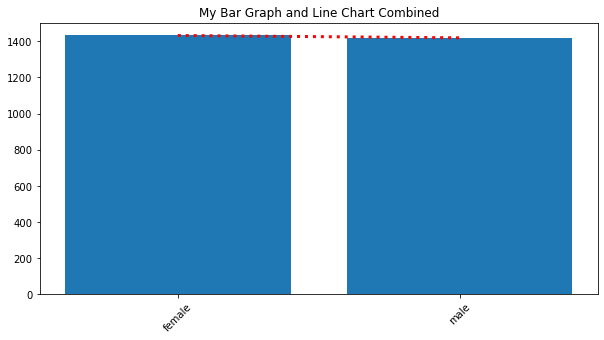

In [19]:
plt.figure(figsize = (10,5))
plt.bar(x = Gender['label'].value_counts().index, height = Gender['label'].value_counts())
plt.plot(Gender['label'].value_counts().index, Gender['label'].value_counts(), color = 'Red', ls = ':', lw = 3)
plt.xticks(rotation = 45)
plt.title("My Bar Graph and Line Chart Combined")

In [20]:
Gender.corr()

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,...,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
Id,1.000000,0.423441,-0.525021,0.343340,0.555125,0.049947,-0.604299,-0.108434,-0.151616,-0.504004,...,0.286635,0.423441,0.773210,0.294314,0.248827,0.324576,0.164870,0.296024,0.293163,-0.037142
meanfreq,0.423441,1.000000,-0.741923,0.924077,0.910995,0.742288,-0.628384,-0.319367,-0.313939,-0.604421,...,0.688672,1.000000,0.448524,0.378820,0.280244,0.535998,0.220328,0.521057,0.517270,-0.228999
sd,-0.525021,-0.741923,1.000000,-0.562995,-0.848960,-0.167634,0.873957,0.310967,0.343378,0.715366,...,-0.532027,-0.741923,-0.454038,-0.339304,-0.136742,-0.486732,-0.349011,-0.488449,-0.482353,0.133479
median,0.343340,0.924077,-0.562995,1.000000,0.772545,0.732938,-0.475962,-0.257094,-0.244301,-0.502036,...,0.679711,0.924077,0.404615,0.330022,0.257550,0.453497,0.180631,0.437742,0.434640,-0.223605
Q25,0.555125,0.910995,-0.848960,0.772545,1.000000,0.477469,-0.875383,-0.312586,-0.344764,-0.650356,...,0.590687,0.910995,0.531689,0.312754,0.202017,0.466120,0.296501,0.460777,0.455611,-0.152750
Q75,0.049947,0.742288,-0.167634,0.732938,0.477469,1.000000,0.006798,-0.208412,-0.149539,-0.182133,...,0.489348,0.742288,0.149706,0.262243,0.290610,0.359507,-0.028663,0.337006,0.337614,-0.225156
IQR,-0.604299,-0.628384,0.873957,-0.475962,-0.875383,0.006798,1.000000,0.241082,0.310095,0.639951,...,-0.403014,-0.628384,-0.522739,-0.211655,-0.070020,-0.332685,-0.353214,-0.338984,-0.332770,0.049962
skew,-0.108434,-0.319367,0.310967,-0.257094,-0.312586,-0.208412,0.241082,1.000000,0.976422,-0.195626,...,-0.432556,-0.319367,-0.163111,-0.217216,-0.095604,-0.336715,-0.057414,-0.305442,-0.304504,-0.162630
kurt,-0.151616,-0.313939,0.343378,-0.244301,-0.344764,-0.149539,0.310095,0.976422,1.000000,-0.124912,...,-0.405428,-0.313939,-0.192141,-0.203453,-0.060314,-0.302926,-0.100471,-0.274293,-0.272576,-0.200493
sp.ent,-0.504004,-0.604421,0.715366,-0.502036,-0.650356,-0.182133,0.639951,-0.195626,-0.124912,1.000000,...,-0.328950,-0.604421,-0.507143,-0.302332,-0.124272,-0.298051,-0.282068,-0.331158,-0.326213,0.206535


C:\Users\virendra.dubey\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


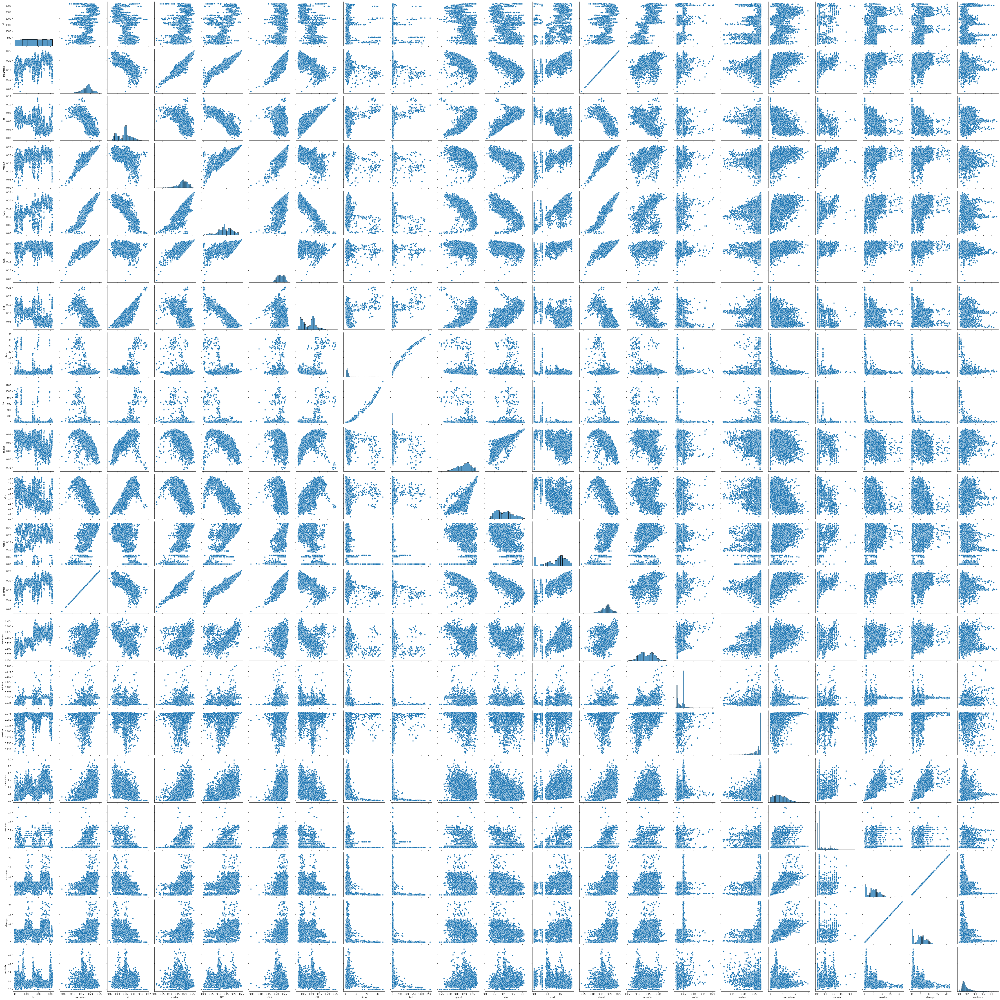

In [16]:
sns.pairplot(Gender, size = 3)

<AxesSubplot:>

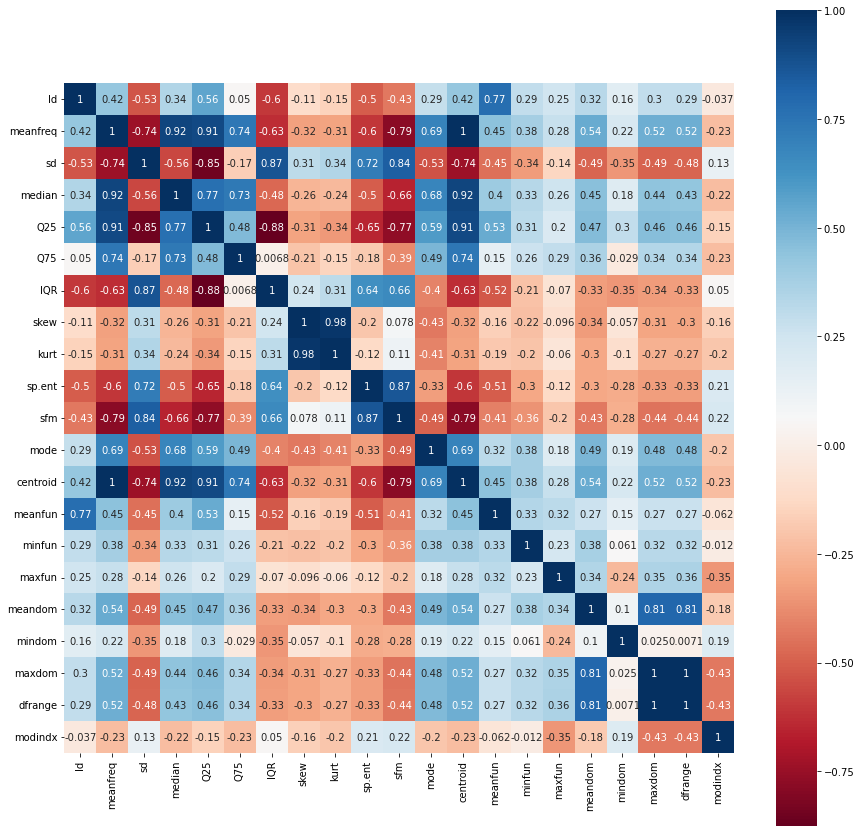

In [21]:
plt.figure(figsize = (15,15))
sns.heatmap(Gender.corr(), annot = True, cmap = 'RdBu', square = True)

###### One hot encoding not required becasue all the data is in numatical not categorical 

In [22]:
Gender.columns

Index(['Id', 'meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx', 'label'],
      dtype='object')

In [90]:
#df.to_csv('C:\Users\virendra.dubey\Desktop\INSAD training\ML _vkd\LMS project')

In [28]:
X = Gender.drop(labels=['Id', 'maxfun','label'], axis=1)
Y = Gender['label']

##### Train _Test Split 

In [29]:
from sklearn.model_selection import train_test_split 
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size = 0.20, random_state = 2018)

In [30]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(2280, 19)
(571, 19)
(2280,)
(571,)


##### Building MOdel :Decision Tree

In [31]:
dtree = DecisionTreeClassifier(random_state=123)
dtree.fit(x_train, y_train)
preds_dtree = dtree.predict(x_test)

In [32]:
preds_dtree.shape

(571,)

##### Tessting Accurecy of DS Tree Model

In [33]:
acc_dtree = accuracy_score(y_test, preds_dtree)
cm_dtree = confusion_matrix(y_test, preds_dtree)
clas_report = classification_report(y_test, preds_dtree)
print('Accuracy of the model is: ', acc_dtree)
print(cm_dtree)
print(clas_report)

Accuracy of the model is:  0.9649737302977233
[[273   7]
 [ 13 278]]
              precision    recall  f1-score   support

      female       0.95      0.97      0.96       280
        male       0.98      0.96      0.97       291

    accuracy                           0.96       571
   macro avg       0.96      0.97      0.96       571
weighted avg       0.97      0.96      0.96       571



#### Observation : accurecy in descion tree model is low 96% only so we shall explore if acc inceases in other model 

#### finding out imporatance facors on feature 

In [34]:
importance = dtree.feature_importances_

In [35]:
importance

array([0.00233944, 0.00230004, 0.00262411, 0.00495296, 0.00679142,
       0.05811953, 0.00353131, 0.00305503, 0.00798765, 0.01613776,
       0.00195421, 0.00131594, 0.84194353, 0.02122291, 0.00116972,
       0.0099228 , 0.00640482, 0.00662939, 0.00159744])

Feature: 0, Score: 0.00234
Feature: 1, Score: 0.00230
Feature: 2, Score: 0.00262
Feature: 3, Score: 0.00495
Feature: 4, Score: 0.00679
Feature: 5, Score: 0.05812
Feature: 6, Score: 0.00353
Feature: 7, Score: 0.00306
Feature: 8, Score: 0.00799
Feature: 9, Score: 0.01614
Feature: 10, Score: 0.00195
Feature: 11, Score: 0.00132
Feature: 12, Score: 0.84194
Feature: 13, Score: 0.02122
Feature: 14, Score: 0.00117
Feature: 15, Score: 0.00992
Feature: 16, Score: 0.00640
Feature: 17, Score: 0.00663
Feature: 18, Score: 0.00160


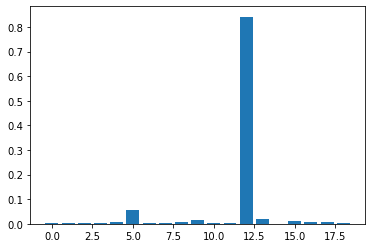

In [36]:

for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

#### Building :Randor forest Model

In [37]:
from sklearn.ensemble import RandomForestClassifier

In [38]:
rf = RandomForestClassifier(n_estimators = 50)
rf.fit(x_train, y_train)
preds_rf = rf.predict(x_test)

In [39]:
preds_rf

array(['female', 'female', 'male', 'male', 'male', 'male', 'female',
       'male', 'male', 'male', 'female', 'male', 'male', 'male', 'male',
       'female', 'female', 'male', 'male', 'male', 'male', 'male',
       'female', 'male', 'female', 'male', 'female', 'male', 'female',
       'female', 'male', 'female', 'female', 'female', 'female', 'female',
       'female', 'female', 'female', 'female', 'female', 'female',
       'female', 'male', 'male', 'male', 'male', 'male', 'female', 'male',
       'male', 'male', 'female', 'male', 'male', 'female', 'female',
       'female', 'female', 'female', 'female', 'female', 'female', 'male',
       'female', 'female', 'male', 'male', 'male', 'male', 'female',
       'female', 'male', 'male', 'female', 'female', 'male', 'male',
       'female', 'male', 'male', 'male', 'male', 'male', 'female',
       'female', 'male', 'female', 'female', 'male', 'male', 'female',
       'female', 'female', 'male', 'male', 'female', 'female', 'female',
       'ma

In [40]:
accuracy_score_rf = accuracy_score(y_test, preds_rf)
confusion_matrix_rf = confusion_matrix(y_test, preds_rf)
classification_report_rf = classification_report(y_test, preds_rf)
print('Accuracy score for Random Forest is: ', accuracy_score_rf)
print(confusion_matrix_rf)
print(classification_report_rf)

Accuracy score for Random Forest is:  0.9772329246935202
[[275   5]
 [  8 283]]
              precision    recall  f1-score   support

      female       0.97      0.98      0.98       280
        male       0.98      0.97      0.98       291

    accuracy                           0.98       571
   macro avg       0.98      0.98      0.98       571
weighted avg       0.98      0.98      0.98       571



#### Observation : accurecy has improved in randome forest Model so for this we will use randome forest model 

### Now since out model is ready ....we can caryout prediction.... on test data.
### However EDA must be performed oin test data before taking on model


#### EDA on test dataset 

In [41]:
test.isna().sum()

Id          0
meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
dtype: int64

##### Observation : There is no NAN value in test data 

In [42]:
test.describe()

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,...,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,...,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000,317.000000
mean,1510.962145,0.180760,0.056971,0.184712,0.141419,0.225080,0.083662,3.335314,43.404854,0.893467,...,0.163493,0.180760,0.142049,0.036509,0.257715,0.789667,0.052765,4.791241,4.738476,0.172115
std,954.569221,0.031038,0.017247,0.038034,0.049213,0.024820,0.043342,4.880362,163.137701,0.046645,...,0.079825,0.031038,0.033350,0.019584,0.032444,0.521110,0.066191,3.470459,3.468318,0.119550
min,0.000000,0.048254,0.024002,0.015790,0.000267,0.058268,0.017429,0.746617,2.627216,0.747695,...,0.000000,0.048254,0.074692,0.009911,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,605.000000,0.163002,0.040663,0.168349,0.110614,0.208474,0.040808,1.722985,6.022468,0.857613,...,0.115893,0.163002,0.113616,0.018223,0.250000,0.389071,0.007812,1.230469,1.187500,0.103764
50%,1506.000000,0.184800,0.059159,0.189412,0.140728,0.225098,0.095429,2.264260,8.674648,0.901328,...,0.185904,0.184800,0.139353,0.042895,0.271186,0.744004,0.023438,4.921875,4.875000,0.144271
75%,2310.000000,0.200154,0.068873,0.210097,0.180614,0.242975,0.113143,2.911882,13.559708,0.927975,...,0.220350,0.200154,0.169202,0.047847,0.277457,1.128551,0.070312,6.742188,6.632812,0.202254
max,3158.000000,0.247041,0.110261,0.256631,0.238583,0.268528,0.245300,34.537488,1271.353628,0.972912,...,0.278072,0.247041,0.216739,0.158416,0.279114,2.515443,0.257812,20.484375,20.460938,0.728497


In [43]:
test.skew()

Id          0.030447
meanfreq   -0.693203
sd          0.068789
median     -0.985354
Q25        -0.450517
Q75        -1.511323
IQR         0.263393
skew        4.724833
kurt        5.551403
sp.ent     -0.432659
sfm         0.254314
mode       -0.816995
centroid   -0.693203
meanfun     0.094642
minfun      1.561346
maxfun     -2.381970
meandom     0.618188
mindom      1.485916
maxdom      0.609948
dfrange     0.611664
modindx     1.972866
dtype: float64

##### Observation : kurt and skew are  highly skewed data 

#### aplying level encoding on test data: since data is numeric level encoding is not required 

In [44]:
test.columns

Index(['Id', 'meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx'],
      dtype='object')

In [53]:
test1 = test.drop(labels=['Id', 'maxfun'], axis=1)

In [54]:
test1.head(5)

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,meandom,mindom,maxdom,dfrange,modindx
0,0.186833,0.027472,0.184325,0.173955,0.204731,0.030777,2.655225,10.565846,0.821812,0.159883,0.180645,0.186833,0.172790,0.023495,0.178571,0.007812,0.226562,0.218750,0.108929
1,0.188879,0.060316,0.195537,0.138072,0.242975,0.104904,1.497393,5.037085,0.909425,0.374225,0.140386,0.188879,0.133092,0.050847,0.855938,0.023438,8.718750,8.695312,0.098712
2,0.150705,0.087127,0.174299,0.069666,0.226082,0.156416,2.603951,22.328899,0.969287,0.781729,0.050181,0.150705,0.109992,0.017260,1.240954,0.007812,5.562500,5.554688,0.332396
3,0.183667,0.040607,0.182534,0.156480,0.207646,0.051166,2.054138,7.483019,0.898138,0.313925,0.177040,0.183667,0.149237,0.018648,0.550312,0.007812,3.421875,3.414062,0.166503
4,0.205159,0.039543,0.210805,0.186667,0.228908,0.042241,2.099683,7.562209,0.876002,0.271880,0.224885,0.205159,0.154736,0.047105,1.578835,0.187500,10.804688,10.617188,0.113644


In [55]:
test1.shape

(317, 19)

##### applying Model on encoded test dataset 

In [56]:
preds_rf_test = rf.predict(test1)

In [57]:
x=preds_rf_test

In [58]:
test.columns

Index(['Id', 'meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx'],
      dtype='object')

In [59]:
test['output']=pd.DataFrame(x)

In [60]:
test['output']

0      female
1        male
2        male
3      female
4      female
        ...  
312    female
313    female
314    female
315      male
316      male
Name: output, Length: 317, dtype: object

In [63]:
test['Id']

0      2148
1      1124
2       170
3      3158
4      2229
       ... 
312    3085
313    1632
314    2893
315    1106
316    1488
Name: Id, Length: 317, dtype: int64

In [64]:
df2=pd.concat([test['Id'],test['output']],axis = 1)

In [65]:
df2.head(5)

,Id,output
0,2148,female
1,1124,male
2,170,male
3,3158,female
4,2229,female


In [72]:
df2.to_csv('Gender_voice_output.csv',index=False,header=False)

In [71]:
df2.tail(5)

,Id,output
312,3085,female
313,1632,female
314,2893,female
315,1106,male
316,1488,male


#### Observation : final outpur file procuced which has predicted output on test dataset 

## Result : Model sucessfully created with 98% accurecy and prediction for Gender voice  carried out on test dataset 